# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

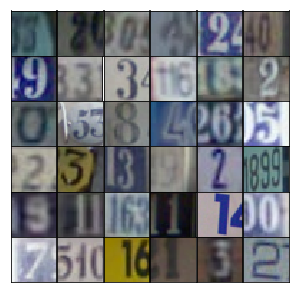

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

In [6]:
trainset['y'].shape  # (73257, 1)
trainset['X'].shape

(32, 32, 3, 73257)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [7]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [8]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(self.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [9]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')  # Discriminator Input
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')  # Generator Input
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3.

In [10]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)  # 4*4*512 analog to the picture
        
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)  # Leaky Relu
        
        # 4x4x512 now
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        
        # 8x8x256 now    
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)
        
        # 16x16x128 now        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')
        # 32x32x3 now
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU. 

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

In [11]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [13]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [14]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [15]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [16]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [17]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

In [18]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 25
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/25... Discriminator Loss: 1.0140... Generator Loss: 0.8933
Epoch 1/25... Discriminator Loss: 0.3465... Generator Loss: 2.2597
Epoch 1/25... Discriminator Loss: 0.0985... Generator Loss: 3.8750
Epoch 1/25... Discriminator Loss: 0.1781... Generator Loss: 2.4894
Epoch 1/25... Discriminator Loss: 0.1295... Generator Loss: 3.0449
Epoch 1/25... Discriminator Loss: 0.1521... Generator Loss: 2.6766
Epoch 1/25... Discriminator Loss: 0.1016... Generator Loss: 3.4180
Epoch 1/25... Discriminator Loss: 0.0824... Generator Loss: 3.3506
Epoch 1/25... Discriminator Loss: 0.1599... Generator Loss: 3.4415
Epoch 1/25... Discriminator Loss: 0.2686... Generator Loss: 2.4244


/home/ubuntu/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


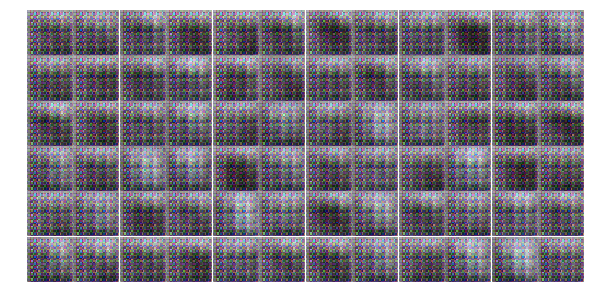

Epoch 1/25... Discriminator Loss: 0.6591... Generator Loss: 1.7420
Epoch 1/25... Discriminator Loss: 0.4601... Generator Loss: 1.9035
Epoch 1/25... Discriminator Loss: 0.4530... Generator Loss: 1.6708
Epoch 1/25... Discriminator Loss: 0.3163... Generator Loss: 2.8094
Epoch 1/25... Discriminator Loss: 0.6987... Generator Loss: 2.6967
Epoch 1/25... Discriminator Loss: 0.4233... Generator Loss: 1.6670
Epoch 1/25... Discriminator Loss: 0.2918... Generator Loss: 2.1225
Epoch 1/25... Discriminator Loss: 0.4726... Generator Loss: 2.4348
Epoch 1/25... Discriminator Loss: 0.5793... Generator Loss: 1.2172
Epoch 1/25... Discriminator Loss: 0.7287... Generator Loss: 1.6190


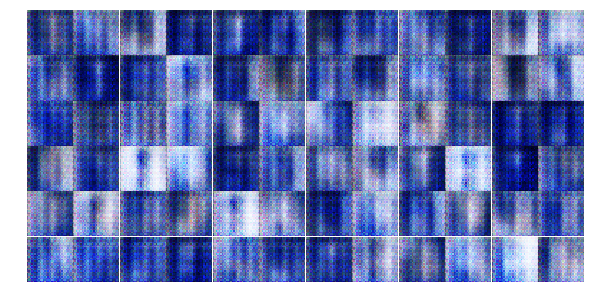

Epoch 1/25... Discriminator Loss: 0.7796... Generator Loss: 0.9450
Epoch 1/25... Discriminator Loss: 0.2018... Generator Loss: 2.2887
Epoch 1/25... Discriminator Loss: 0.5999... Generator Loss: 2.4786
Epoch 1/25... Discriminator Loss: 0.9410... Generator Loss: 4.4434
Epoch 1/25... Discriminator Loss: 1.5151... Generator Loss: 0.4518
Epoch 1/25... Discriminator Loss: 1.2527... Generator Loss: 0.7624
Epoch 1/25... Discriminator Loss: 1.3298... Generator Loss: 0.9017
Epoch 1/25... Discriminator Loss: 1.6390... Generator Loss: 1.0639
Epoch 1/25... Discriminator Loss: 1.0548... Generator Loss: 1.1980
Epoch 1/25... Discriminator Loss: 0.4740... Generator Loss: 2.4253


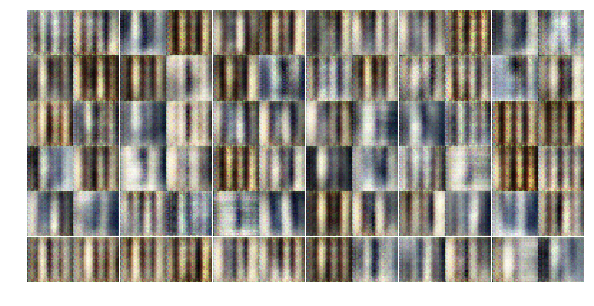

Epoch 1/25... Discriminator Loss: 0.8076... Generator Loss: 1.5329
Epoch 1/25... Discriminator Loss: 0.6510... Generator Loss: 1.5017
Epoch 1/25... Discriminator Loss: 0.3899... Generator Loss: 1.7271
Epoch 1/25... Discriminator Loss: 0.3149... Generator Loss: 3.0022
Epoch 1/25... Discriminator Loss: 0.3909... Generator Loss: 2.4809
Epoch 1/25... Discriminator Loss: 0.2594... Generator Loss: 3.0933
Epoch 1/25... Discriminator Loss: 0.9983... Generator Loss: 0.7105
Epoch 1/25... Discriminator Loss: 0.3314... Generator Loss: 3.5337
Epoch 1/25... Discriminator Loss: 0.8837... Generator Loss: 1.5688
Epoch 1/25... Discriminator Loss: 0.6121... Generator Loss: 1.6376


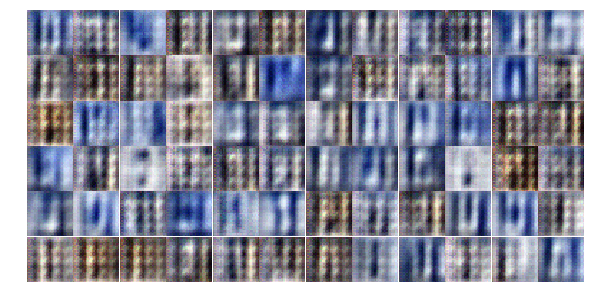

Epoch 1/25... Discriminator Loss: 0.9283... Generator Loss: 1.1989
Epoch 1/25... Discriminator Loss: 0.5588... Generator Loss: 1.3599
Epoch 1/25... Discriminator Loss: 1.1642... Generator Loss: 0.4920
Epoch 1/25... Discriminator Loss: 0.2875... Generator Loss: 3.4942
Epoch 1/25... Discriminator Loss: 0.4091... Generator Loss: 1.6610
Epoch 1/25... Discriminator Loss: 0.8350... Generator Loss: 1.0452
Epoch 1/25... Discriminator Loss: 0.3406... Generator Loss: 1.9214
Epoch 1/25... Discriminator Loss: 0.3057... Generator Loss: 2.3791
Epoch 1/25... Discriminator Loss: 0.2564... Generator Loss: 2.5803
Epoch 1/25... Discriminator Loss: 0.9219... Generator Loss: 1.1772


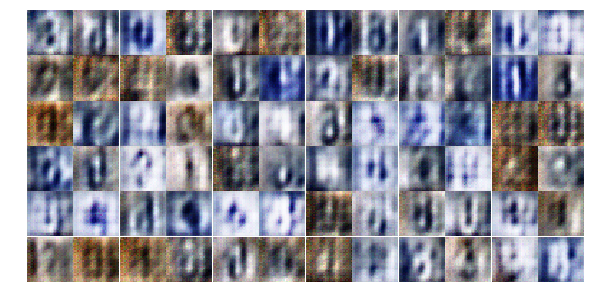

Epoch 1/25... Discriminator Loss: 0.6862... Generator Loss: 2.3742
Epoch 1/25... Discriminator Loss: 0.3503... Generator Loss: 2.2121
Epoch 1/25... Discriminator Loss: 0.3683... Generator Loss: 4.9210
Epoch 1/25... Discriminator Loss: 1.7098... Generator Loss: 0.3530
Epoch 1/25... Discriminator Loss: 1.0372... Generator Loss: 1.0930
Epoch 1/25... Discriminator Loss: 0.4115... Generator Loss: 3.6074
Epoch 1/25... Discriminator Loss: 0.4605... Generator Loss: 1.5137
Epoch 2/25... Discriminator Loss: 1.0273... Generator Loss: 1.0802
Epoch 2/25... Discriminator Loss: 1.6664... Generator Loss: 0.3606
Epoch 2/25... Discriminator Loss: 1.1742... Generator Loss: 0.6757


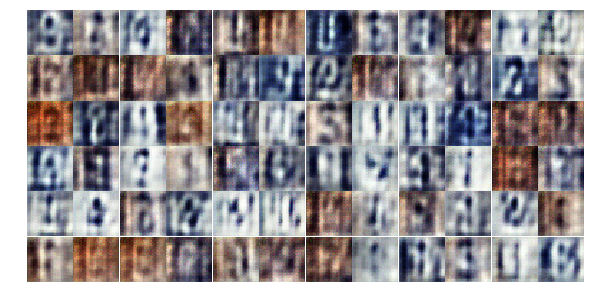

Epoch 2/25... Discriminator Loss: 0.2905... Generator Loss: 2.5082
Epoch 2/25... Discriminator Loss: 0.2116... Generator Loss: 2.3260
Epoch 2/25... Discriminator Loss: 1.6428... Generator Loss: 0.3436
Epoch 2/25... Discriminator Loss: 0.4749... Generator Loss: 2.1009
Epoch 2/25... Discriminator Loss: 0.3407... Generator Loss: 3.6244
Epoch 2/25... Discriminator Loss: 0.8150... Generator Loss: 3.4886
Epoch 2/25... Discriminator Loss: 0.3762... Generator Loss: 1.6316
Epoch 2/25... Discriminator Loss: 0.5776... Generator Loss: 1.3618
Epoch 2/25... Discriminator Loss: 0.4159... Generator Loss: 3.5125
Epoch 2/25... Discriminator Loss: 0.3607... Generator Loss: 2.0294


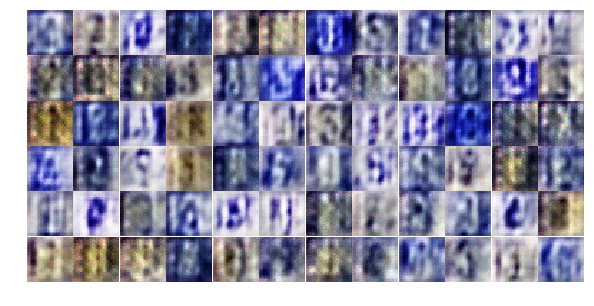

Epoch 2/25... Discriminator Loss: 0.6879... Generator Loss: 3.5049
Epoch 2/25... Discriminator Loss: 0.4038... Generator Loss: 1.5345
Epoch 2/25... Discriminator Loss: 0.9109... Generator Loss: 1.4975
Epoch 2/25... Discriminator Loss: 0.4363... Generator Loss: 2.0093
Epoch 2/25... Discriminator Loss: 0.6154... Generator Loss: 3.9753
Epoch 2/25... Discriminator Loss: 1.6529... Generator Loss: 0.3991
Epoch 2/25... Discriminator Loss: 1.9411... Generator Loss: 0.2967
Epoch 2/25... Discriminator Loss: 0.6922... Generator Loss: 1.9750
Epoch 2/25... Discriminator Loss: 0.5612... Generator Loss: 1.4998
Epoch 2/25... Discriminator Loss: 0.3715... Generator Loss: 1.9150


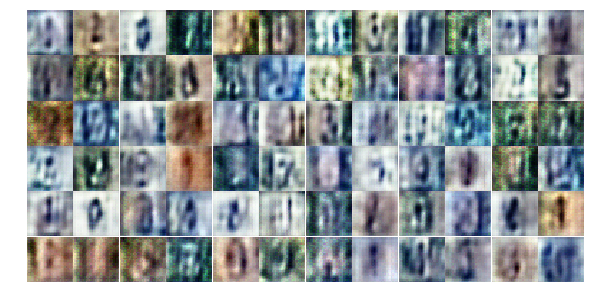

Epoch 2/25... Discriminator Loss: 0.5910... Generator Loss: 1.3881
Epoch 2/25... Discriminator Loss: 0.4870... Generator Loss: 2.0605
Epoch 2/25... Discriminator Loss: 1.1256... Generator Loss: 4.4160
Epoch 2/25... Discriminator Loss: 0.2639... Generator Loss: 2.7246
Epoch 2/25... Discriminator Loss: 0.9443... Generator Loss: 1.4488
Epoch 2/25... Discriminator Loss: 0.4794... Generator Loss: 1.7973
Epoch 2/25... Discriminator Loss: 0.6815... Generator Loss: 1.8796
Epoch 2/25... Discriminator Loss: 0.7980... Generator Loss: 0.9995
Epoch 2/25... Discriminator Loss: 0.8801... Generator Loss: 0.7471
Epoch 2/25... Discriminator Loss: 0.4633... Generator Loss: 1.7733


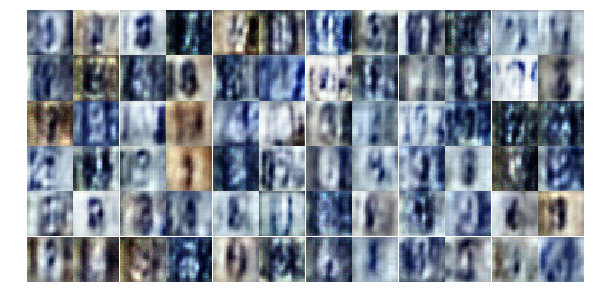

Epoch 2/25... Discriminator Loss: 0.4155... Generator Loss: 1.9792
Epoch 2/25... Discriminator Loss: 2.0046... Generator Loss: 0.3065
Epoch 2/25... Discriminator Loss: 1.8492... Generator Loss: 3.8002
Epoch 2/25... Discriminator Loss: 1.8976... Generator Loss: 0.2771
Epoch 2/25... Discriminator Loss: 0.7617... Generator Loss: 2.1808
Epoch 2/25... Discriminator Loss: 1.1143... Generator Loss: 2.3560
Epoch 2/25... Discriminator Loss: 0.9379... Generator Loss: 1.0596
Epoch 2/25... Discriminator Loss: 0.5903... Generator Loss: 2.0669
Epoch 2/25... Discriminator Loss: 1.5406... Generator Loss: 0.3379
Epoch 2/25... Discriminator Loss: 0.8562... Generator Loss: 1.0088


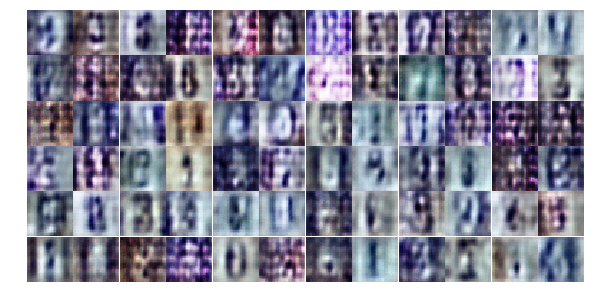

Epoch 2/25... Discriminator Loss: 0.5121... Generator Loss: 1.7656
Epoch 2/25... Discriminator Loss: 1.8605... Generator Loss: 0.2976
Epoch 2/25... Discriminator Loss: 0.6597... Generator Loss: 1.0926
Epoch 2/25... Discriminator Loss: 0.9267... Generator Loss: 0.8643
Epoch 2/25... Discriminator Loss: 1.1057... Generator Loss: 0.7326
Epoch 2/25... Discriminator Loss: 1.0665... Generator Loss: 0.8541
Epoch 2/25... Discriminator Loss: 0.6107... Generator Loss: 1.5455
Epoch 2/25... Discriminator Loss: 0.7913... Generator Loss: 1.3848
Epoch 2/25... Discriminator Loss: 0.3997... Generator Loss: 2.1473
Epoch 2/25... Discriminator Loss: 0.7962... Generator Loss: 0.8053


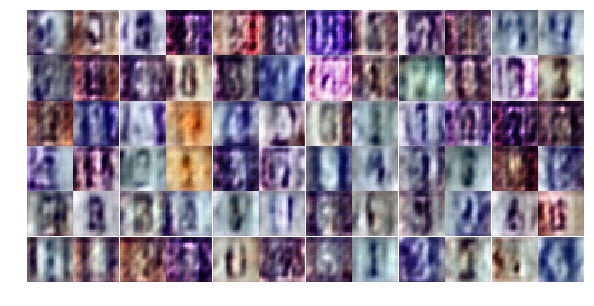

Epoch 2/25... Discriminator Loss: 0.9767... Generator Loss: 0.7049
Epoch 2/25... Discriminator Loss: 0.5301... Generator Loss: 1.3689
Epoch 2/25... Discriminator Loss: 1.2857... Generator Loss: 1.9694
Epoch 2/25... Discriminator Loss: 0.6342... Generator Loss: 2.6016
Epoch 3/25... Discriminator Loss: 0.3399... Generator Loss: 2.3103
Epoch 3/25... Discriminator Loss: 0.3067... Generator Loss: 3.2408
Epoch 3/25... Discriminator Loss: 0.3874... Generator Loss: 2.5871
Epoch 3/25... Discriminator Loss: 0.3326... Generator Loss: 2.9500
Epoch 3/25... Discriminator Loss: 0.9078... Generator Loss: 4.5942
Epoch 3/25... Discriminator Loss: 0.7513... Generator Loss: 0.8948


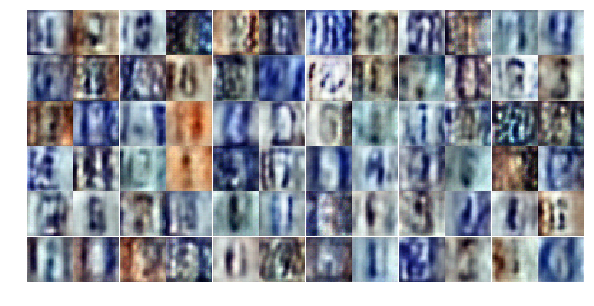

Epoch 3/25... Discriminator Loss: 0.3392... Generator Loss: 2.8983
Epoch 3/25... Discriminator Loss: 0.7798... Generator Loss: 4.2996
Epoch 3/25... Discriminator Loss: 0.6845... Generator Loss: 1.0147
Epoch 3/25... Discriminator Loss: 1.2540... Generator Loss: 0.4742
Epoch 3/25... Discriminator Loss: 2.3390... Generator Loss: 0.1398
Epoch 3/25... Discriminator Loss: 0.7515... Generator Loss: 1.0157
Epoch 3/25... Discriminator Loss: 1.1860... Generator Loss: 0.4806
Epoch 3/25... Discriminator Loss: 0.1653... Generator Loss: 2.6840
Epoch 3/25... Discriminator Loss: 1.6979... Generator Loss: 0.2630
Epoch 3/25... Discriminator Loss: 0.3231... Generator Loss: 1.8868


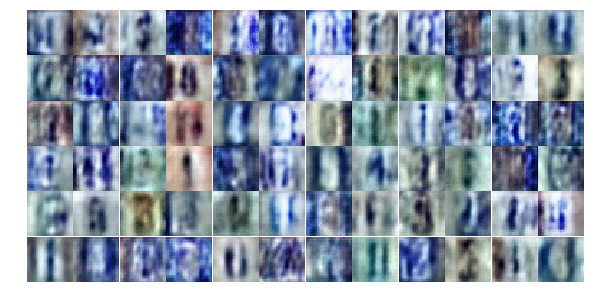

Epoch 3/25... Discriminator Loss: 0.1593... Generator Loss: 3.7426
Epoch 3/25... Discriminator Loss: 0.3006... Generator Loss: 1.9839
Epoch 3/25... Discriminator Loss: 1.3314... Generator Loss: 0.4559
Epoch 3/25... Discriminator Loss: 0.1671... Generator Loss: 2.7445
Epoch 3/25... Discriminator Loss: 0.8892... Generator Loss: 4.5703
Epoch 3/25... Discriminator Loss: 0.4682... Generator Loss: 1.6688
Epoch 3/25... Discriminator Loss: 0.5966... Generator Loss: 1.0944
Epoch 3/25... Discriminator Loss: 0.1852... Generator Loss: 3.2445
Epoch 3/25... Discriminator Loss: 0.2471... Generator Loss: 5.5980
Epoch 3/25... Discriminator Loss: 1.2482... Generator Loss: 0.4346


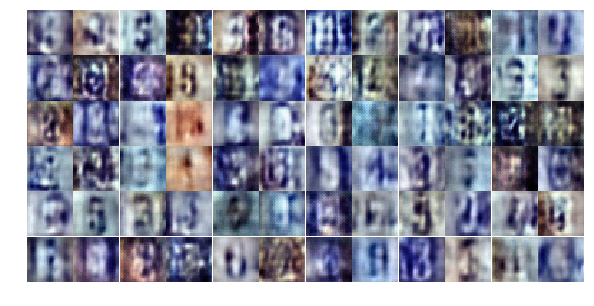

Epoch 3/25... Discriminator Loss: 0.4485... Generator Loss: 1.5735
Epoch 3/25... Discriminator Loss: 0.5963... Generator Loss: 1.4648
Epoch 3/25... Discriminator Loss: 0.2299... Generator Loss: 2.1223
Epoch 3/25... Discriminator Loss: 0.5749... Generator Loss: 1.1450
Epoch 3/25... Discriminator Loss: 1.2643... Generator Loss: 1.5078
Epoch 3/25... Discriminator Loss: 1.4423... Generator Loss: 0.3428
Epoch 3/25... Discriminator Loss: 0.8486... Generator Loss: 0.9619
Epoch 3/25... Discriminator Loss: 0.2503... Generator Loss: 2.3317
Epoch 3/25... Discriminator Loss: 0.2099... Generator Loss: 2.6644
Epoch 3/25... Discriminator Loss: 1.8231... Generator Loss: 4.6415


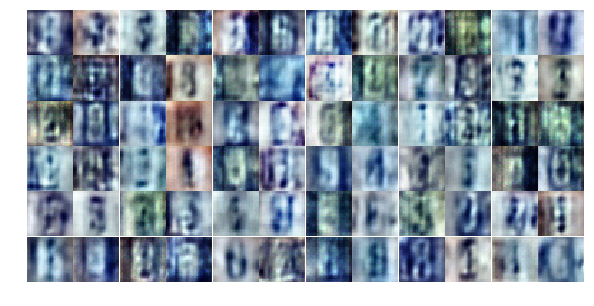

Epoch 3/25... Discriminator Loss: 0.5665... Generator Loss: 1.0428
Epoch 3/25... Discriminator Loss: 0.5646... Generator Loss: 1.3333
Epoch 3/25... Discriminator Loss: 0.2774... Generator Loss: 2.2669
Epoch 3/25... Discriminator Loss: 1.2393... Generator Loss: 0.4614
Epoch 3/25... Discriminator Loss: 0.6073... Generator Loss: 3.1619
Epoch 3/25... Discriminator Loss: 0.9688... Generator Loss: 5.1122
Epoch 3/25... Discriminator Loss: 1.0092... Generator Loss: 3.7322
Epoch 3/25... Discriminator Loss: 0.6693... Generator Loss: 1.1363
Epoch 3/25... Discriminator Loss: 0.6861... Generator Loss: 2.8380
Epoch 3/25... Discriminator Loss: 0.3569... Generator Loss: 1.6986


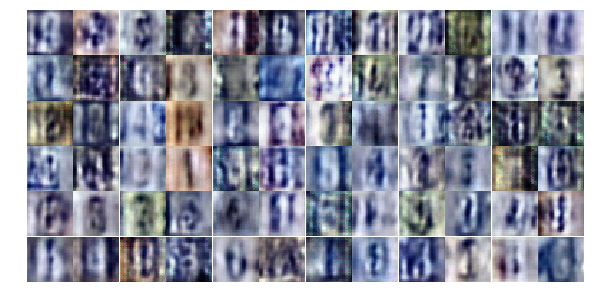

Epoch 3/25... Discriminator Loss: 0.2707... Generator Loss: 2.2899
Epoch 3/25... Discriminator Loss: 0.8992... Generator Loss: 0.7188
Epoch 3/25... Discriminator Loss: 0.7651... Generator Loss: 0.8639
Epoch 3/25... Discriminator Loss: 0.1599... Generator Loss: 4.4640
Epoch 3/25... Discriminator Loss: 0.4510... Generator Loss: 1.3482
Epoch 3/25... Discriminator Loss: 0.2476... Generator Loss: 2.3623
Epoch 3/25... Discriminator Loss: 0.5661... Generator Loss: 4.4893
Epoch 3/25... Discriminator Loss: 0.4528... Generator Loss: 2.8471
Epoch 3/25... Discriminator Loss: 0.4497... Generator Loss: 1.6957
Epoch 3/25... Discriminator Loss: 0.5295... Generator Loss: 1.4956


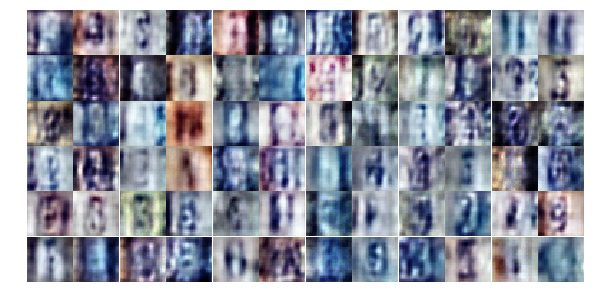

Epoch 3/25... Discriminator Loss: 0.4740... Generator Loss: 1.7841
Epoch 4/25... Discriminator Loss: 1.2922... Generator Loss: 0.4742
Epoch 4/25... Discriminator Loss: 0.3014... Generator Loss: 2.2461
Epoch 4/25... Discriminator Loss: 0.4919... Generator Loss: 3.7565
Epoch 4/25... Discriminator Loss: 0.5896... Generator Loss: 1.2388
Epoch 4/25... Discriminator Loss: 0.3757... Generator Loss: 1.7045
Epoch 4/25... Discriminator Loss: 1.0178... Generator Loss: 6.1622
Epoch 4/25... Discriminator Loss: 0.5896... Generator Loss: 1.0837
Epoch 4/25... Discriminator Loss: 0.6196... Generator Loss: 4.6203
Epoch 4/25... Discriminator Loss: 1.5139... Generator Loss: 0.3457


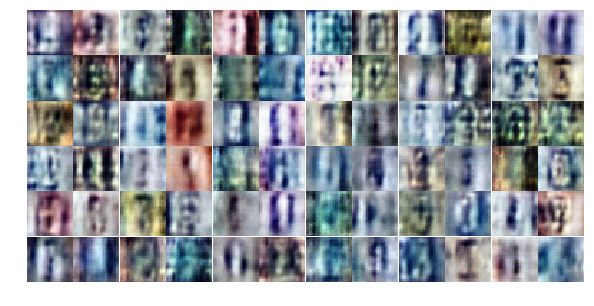

Epoch 4/25... Discriminator Loss: 0.3895... Generator Loss: 1.9833
Epoch 4/25... Discriminator Loss: 0.4386... Generator Loss: 1.4790
Epoch 4/25... Discriminator Loss: 1.1317... Generator Loss: 2.0207
Epoch 4/25... Discriminator Loss: 0.1192... Generator Loss: 5.2806
Epoch 4/25... Discriminator Loss: 0.5865... Generator Loss: 2.8975
Epoch 4/25... Discriminator Loss: 0.4838... Generator Loss: 1.4385
Epoch 4/25... Discriminator Loss: 1.2383... Generator Loss: 0.4995
Epoch 4/25... Discriminator Loss: 0.6287... Generator Loss: 1.0686
Epoch 4/25... Discriminator Loss: 0.2921... Generator Loss: 2.1257
Epoch 4/25... Discriminator Loss: 0.4048... Generator Loss: 3.7904


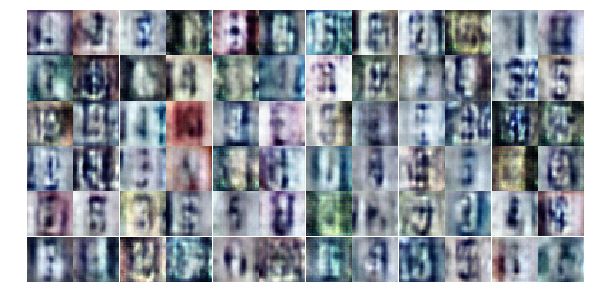

Epoch 4/25... Discriminator Loss: 0.7031... Generator Loss: 4.2745
Epoch 4/25... Discriminator Loss: 0.3798... Generator Loss: 1.5197
Epoch 4/25... Discriminator Loss: 0.1999... Generator Loss: 3.5657
Epoch 4/25... Discriminator Loss: 0.8328... Generator Loss: 0.8421
Epoch 4/25... Discriminator Loss: 0.3855... Generator Loss: 2.4809
Epoch 4/25... Discriminator Loss: 0.2288... Generator Loss: 2.4603
Epoch 4/25... Discriminator Loss: 0.1625... Generator Loss: 3.6786
Epoch 4/25... Discriminator Loss: 0.3906... Generator Loss: 3.0098
Epoch 4/25... Discriminator Loss: 0.4746... Generator Loss: 1.4232
Epoch 4/25... Discriminator Loss: 0.1105... Generator Loss: 3.6447


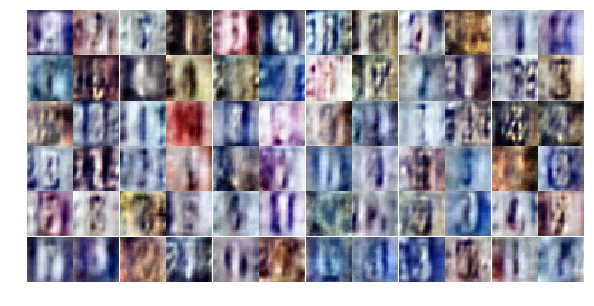

Epoch 4/25... Discriminator Loss: 0.4449... Generator Loss: 1.3480
Epoch 4/25... Discriminator Loss: 0.1247... Generator Loss: 3.9525
Epoch 4/25... Discriminator Loss: 0.1547... Generator Loss: 3.3343
Epoch 4/25... Discriminator Loss: 0.2845... Generator Loss: 1.9635
Epoch 4/25... Discriminator Loss: 0.8725... Generator Loss: 4.2010
Epoch 4/25... Discriminator Loss: 0.4379... Generator Loss: 1.4885
Epoch 4/25... Discriminator Loss: 1.4673... Generator Loss: 3.1132
Epoch 4/25... Discriminator Loss: 1.1002... Generator Loss: 5.4183
Epoch 4/25... Discriminator Loss: 0.3144... Generator Loss: 2.8458
Epoch 4/25... Discriminator Loss: 0.3981... Generator Loss: 2.1689


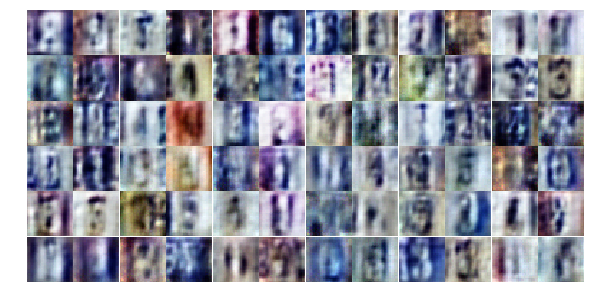

Epoch 4/25... Discriminator Loss: 0.8702... Generator Loss: 0.7421
Epoch 4/25... Discriminator Loss: 0.2687... Generator Loss: 2.5839
Epoch 4/25... Discriminator Loss: 0.6143... Generator Loss: 0.9543
Epoch 4/25... Discriminator Loss: 0.1451... Generator Loss: 2.7465
Epoch 4/25... Discriminator Loss: 0.1965... Generator Loss: 2.6297
Epoch 4/25... Discriminator Loss: 0.1566... Generator Loss: 3.4266
Epoch 4/25... Discriminator Loss: 0.2217... Generator Loss: 2.3246
Epoch 4/25... Discriminator Loss: 0.1586... Generator Loss: 2.6101
Epoch 4/25... Discriminator Loss: 0.2693... Generator Loss: 3.4254
Epoch 4/25... Discriminator Loss: 1.4764... Generator Loss: 1.0219


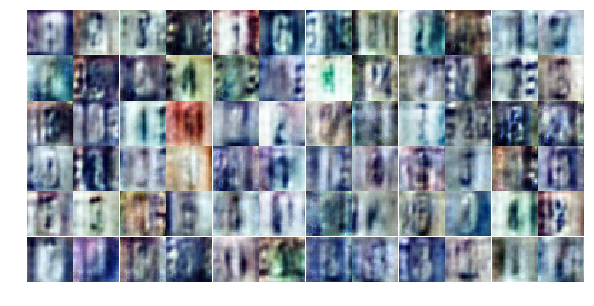

Epoch 4/25... Discriminator Loss: 0.3372... Generator Loss: 1.6828
Epoch 4/25... Discriminator Loss: 2.2999... Generator Loss: 3.4964
Epoch 4/25... Discriminator Loss: 0.1342... Generator Loss: 4.4261
Epoch 4/25... Discriminator Loss: 0.5103... Generator Loss: 1.5894
Epoch 4/25... Discriminator Loss: 1.2697... Generator Loss: 0.5049
Epoch 4/25... Discriminator Loss: 0.8587... Generator Loss: 2.9322
Epoch 4/25... Discriminator Loss: 0.4798... Generator Loss: 1.3435
Epoch 4/25... Discriminator Loss: 0.1719... Generator Loss: 3.4719
Epoch 4/25... Discriminator Loss: 0.3555... Generator Loss: 1.7619
Epoch 5/25... Discriminator Loss: 1.0025... Generator Loss: 0.6130


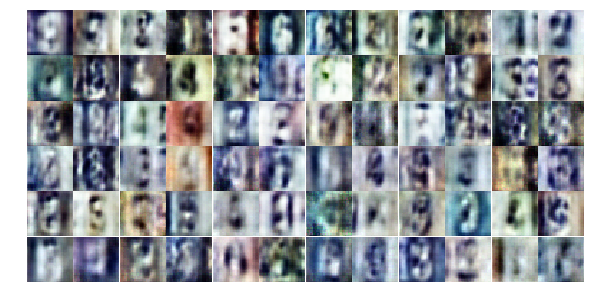

Epoch 5/25... Discriminator Loss: 0.2067... Generator Loss: 3.4606
Epoch 5/25... Discriminator Loss: 0.4645... Generator Loss: 1.3490
Epoch 5/25... Discriminator Loss: 1.4633... Generator Loss: 0.3776
Epoch 5/25... Discriminator Loss: 0.1557... Generator Loss: 3.6221
Epoch 5/25... Discriminator Loss: 0.0730... Generator Loss: 5.4782
Epoch 5/25... Discriminator Loss: 0.2048... Generator Loss: 4.5940
Epoch 5/25... Discriminator Loss: 0.1994... Generator Loss: 4.5150
Epoch 5/25... Discriminator Loss: 0.2407... Generator Loss: 2.1031
Epoch 5/25... Discriminator Loss: 0.3865... Generator Loss: 3.3101
Epoch 5/25... Discriminator Loss: 0.2081... Generator Loss: 5.8696


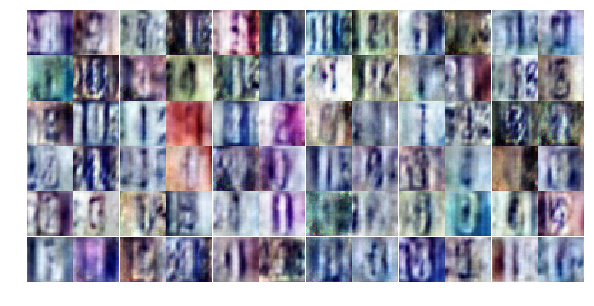

Epoch 5/25... Discriminator Loss: 0.3061... Generator Loss: 2.1825
Epoch 5/25... Discriminator Loss: 1.2675... Generator Loss: 0.4661
Epoch 5/25... Discriminator Loss: 0.2432... Generator Loss: 2.7836
Epoch 5/25... Discriminator Loss: 0.4767... Generator Loss: 1.4597
Epoch 5/25... Discriminator Loss: 0.2632... Generator Loss: 2.1386
Epoch 5/25... Discriminator Loss: 0.7547... Generator Loss: 2.6913
Epoch 5/25... Discriminator Loss: 0.4942... Generator Loss: 1.4153
Epoch 5/25... Discriminator Loss: 0.2164... Generator Loss: 2.9751
Epoch 5/25... Discriminator Loss: 0.2951... Generator Loss: 2.0894
Epoch 5/25... Discriminator Loss: 0.2520... Generator Loss: 2.9212


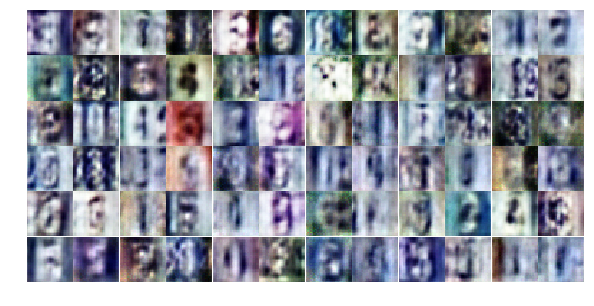

Epoch 5/25... Discriminator Loss: 0.2162... Generator Loss: 3.0524
Epoch 5/25... Discriminator Loss: 0.5181... Generator Loss: 1.2935
Epoch 5/25... Discriminator Loss: 0.5553... Generator Loss: 1.3849
Epoch 5/25... Discriminator Loss: 0.1981... Generator Loss: 2.8319
Epoch 5/25... Discriminator Loss: 1.2914... Generator Loss: 0.4928
Epoch 5/25... Discriminator Loss: 0.5548... Generator Loss: 1.2890
Epoch 5/25... Discriminator Loss: 0.2606... Generator Loss: 1.9846
Epoch 5/25... Discriminator Loss: 0.3639... Generator Loss: 1.8511
Epoch 5/25... Discriminator Loss: 0.2345... Generator Loss: 2.1286
Epoch 5/25... Discriminator Loss: 0.2183... Generator Loss: 2.5053


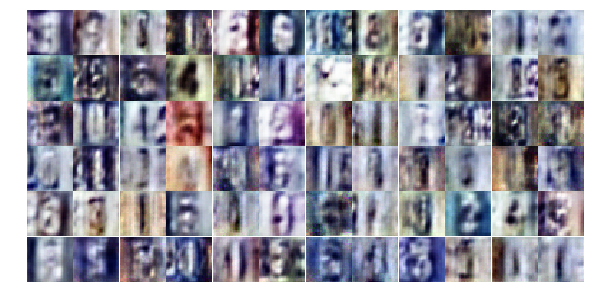

Epoch 5/25... Discriminator Loss: 0.5449... Generator Loss: 1.1558
Epoch 5/25... Discriminator Loss: 0.3277... Generator Loss: 1.7217
Epoch 5/25... Discriminator Loss: 0.6574... Generator Loss: 1.1507
Epoch 5/25... Discriminator Loss: 1.4872... Generator Loss: 0.4249
Epoch 5/25... Discriminator Loss: 1.0755... Generator Loss: 1.4354
Epoch 5/25... Discriminator Loss: 1.5044... Generator Loss: 1.8982
Epoch 5/25... Discriminator Loss: 1.7500... Generator Loss: 0.3492
Epoch 5/25... Discriminator Loss: 0.1525... Generator Loss: 5.4181
Epoch 5/25... Discriminator Loss: 0.5393... Generator Loss: 1.1514
Epoch 5/25... Discriminator Loss: 0.1214... Generator Loss: 4.1031


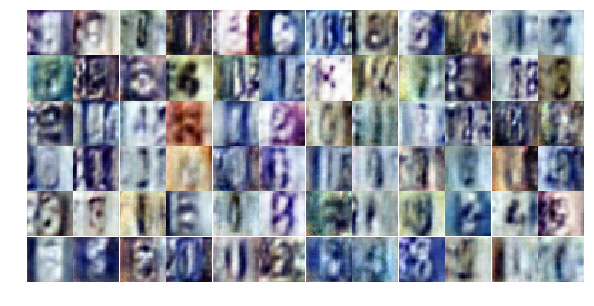

Epoch 5/25... Discriminator Loss: 0.4549... Generator Loss: 1.4182
Epoch 5/25... Discriminator Loss: 0.1710... Generator Loss: 3.4283
Epoch 5/25... Discriminator Loss: 0.3408... Generator Loss: 1.6741
Epoch 5/25... Discriminator Loss: 0.5056... Generator Loss: 1.3660
Epoch 5/25... Discriminator Loss: 0.4688... Generator Loss: 1.3681
Epoch 5/25... Discriminator Loss: 1.6286... Generator Loss: 0.3380
Epoch 5/25... Discriminator Loss: 0.1807... Generator Loss: 3.4237
Epoch 5/25... Discriminator Loss: 0.5506... Generator Loss: 3.0989
Epoch 5/25... Discriminator Loss: 0.6052... Generator Loss: 2.5602
Epoch 5/25... Discriminator Loss: 0.1601... Generator Loss: 4.7106


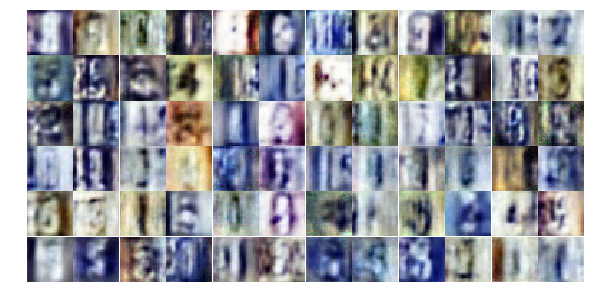

Epoch 5/25... Discriminator Loss: 0.0815... Generator Loss: 4.1356
Epoch 5/25... Discriminator Loss: 0.5378... Generator Loss: 1.2845
Epoch 5/25... Discriminator Loss: 0.1358... Generator Loss: 2.8473
Epoch 5/25... Discriminator Loss: 0.3160... Generator Loss: 1.7332
Epoch 5/25... Discriminator Loss: 0.8154... Generator Loss: 2.0992
Epoch 5/25... Discriminator Loss: 2.1258... Generator Loss: 0.1803
Epoch 6/25... Discriminator Loss: 0.2804... Generator Loss: 2.3264
Epoch 6/25... Discriminator Loss: 0.3054... Generator Loss: 3.9873
Epoch 6/25... Discriminator Loss: 0.1811... Generator Loss: 3.4178
Epoch 6/25... Discriminator Loss: 0.1612... Generator Loss: 3.8211


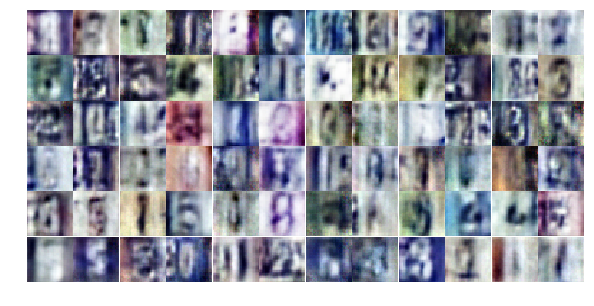

Epoch 6/25... Discriminator Loss: 0.3261... Generator Loss: 1.9995
Epoch 6/25... Discriminator Loss: 0.4032... Generator Loss: 3.0128
Epoch 6/25... Discriminator Loss: 0.2791... Generator Loss: 2.0191
Epoch 6/25... Discriminator Loss: 0.2788... Generator Loss: 1.9391
Epoch 6/25... Discriminator Loss: 0.2801... Generator Loss: 1.8228
Epoch 6/25... Discriminator Loss: 0.3441... Generator Loss: 2.2321
Epoch 6/25... Discriminator Loss: 0.2189... Generator Loss: 2.3672
Epoch 6/25... Discriminator Loss: 0.5767... Generator Loss: 8.4691
Epoch 6/25... Discriminator Loss: 0.2475... Generator Loss: 3.5062
Epoch 6/25... Discriminator Loss: 0.3291... Generator Loss: 1.8597


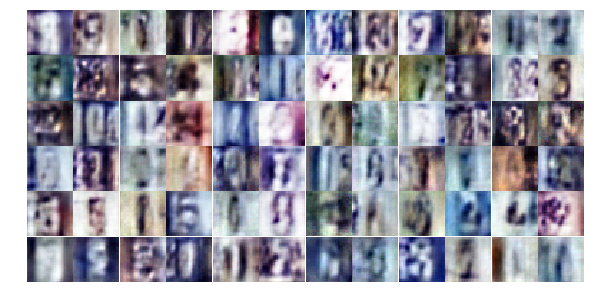

Epoch 6/25... Discriminator Loss: 0.9028... Generator Loss: 4.8361
Epoch 6/25... Discriminator Loss: 0.4805... Generator Loss: 1.3403
Epoch 6/25... Discriminator Loss: 0.9385... Generator Loss: 0.6516
Epoch 6/25... Discriminator Loss: 0.3479... Generator Loss: 2.7307
Epoch 6/25... Discriminator Loss: 0.5465... Generator Loss: 1.1903
Epoch 6/25... Discriminator Loss: 0.6701... Generator Loss: 6.0318
Epoch 6/25... Discriminator Loss: 0.5329... Generator Loss: 1.1893
Epoch 6/25... Discriminator Loss: 0.1844... Generator Loss: 2.9720
Epoch 6/25... Discriminator Loss: 0.4143... Generator Loss: 2.5110
Epoch 6/25... Discriminator Loss: 0.5387... Generator Loss: 1.1906


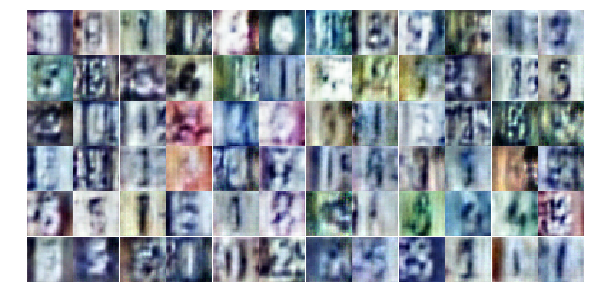

Epoch 6/25... Discriminator Loss: 0.4386... Generator Loss: 1.3282
Epoch 6/25... Discriminator Loss: 0.2277... Generator Loss: 2.0958
Epoch 6/25... Discriminator Loss: 0.7954... Generator Loss: 0.8317
Epoch 6/25... Discriminator Loss: 0.6240... Generator Loss: 1.1508
Epoch 6/25... Discriminator Loss: 0.4350... Generator Loss: 1.5294
Epoch 6/25... Discriminator Loss: 0.2016... Generator Loss: 3.0841
Epoch 6/25... Discriminator Loss: 0.1653... Generator Loss: 2.9310
Epoch 6/25... Discriminator Loss: 0.1199... Generator Loss: 3.0348
Epoch 6/25... Discriminator Loss: 1.0693... Generator Loss: 2.8625
Epoch 6/25... Discriminator Loss: 0.1909... Generator Loss: 2.4232


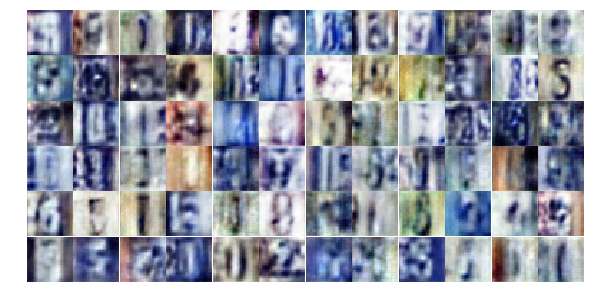

Epoch 6/25... Discriminator Loss: 1.7127... Generator Loss: 0.2837
Epoch 6/25... Discriminator Loss: 0.1251... Generator Loss: 4.3530
Epoch 6/25... Discriminator Loss: 0.4187... Generator Loss: 1.5414
Epoch 6/25... Discriminator Loss: 0.1753... Generator Loss: 3.2076
Epoch 6/25... Discriminator Loss: 0.5374... Generator Loss: 1.1682
Epoch 6/25... Discriminator Loss: 0.2781... Generator Loss: 2.9502
Epoch 6/25... Discriminator Loss: 0.3433... Generator Loss: 2.1440
Epoch 6/25... Discriminator Loss: 2.2658... Generator Loss: 4.7162
Epoch 6/25... Discriminator Loss: 0.8439... Generator Loss: 0.8562
Epoch 6/25... Discriminator Loss: 0.4066... Generator Loss: 1.6468


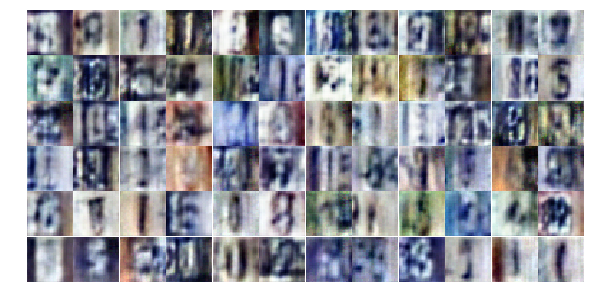

Epoch 6/25... Discriminator Loss: 0.2611... Generator Loss: 2.3338
Epoch 6/25... Discriminator Loss: 0.3051... Generator Loss: 3.7772
Epoch 6/25... Discriminator Loss: 0.8191... Generator Loss: 0.8762
Epoch 6/25... Discriminator Loss: 0.4523... Generator Loss: 1.4529
Epoch 6/25... Discriminator Loss: 0.1755... Generator Loss: 3.3088
Epoch 6/25... Discriminator Loss: 0.3175... Generator Loss: 1.6707
Epoch 6/25... Discriminator Loss: 0.1614... Generator Loss: 3.8514
Epoch 6/25... Discriminator Loss: 0.2662... Generator Loss: 2.1590
Epoch 6/25... Discriminator Loss: 0.2621... Generator Loss: 2.0747
Epoch 6/25... Discriminator Loss: 0.6135... Generator Loss: 1.0639


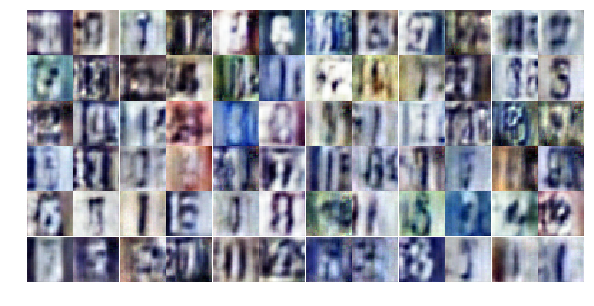

Epoch 6/25... Discriminator Loss: 0.5811... Generator Loss: 1.0740
Epoch 6/25... Discriminator Loss: 0.3026... Generator Loss: 2.1574
Epoch 6/25... Discriminator Loss: 0.2453... Generator Loss: 2.4302
Epoch 7/25... Discriminator Loss: 0.2228... Generator Loss: 2.4176
Epoch 7/25... Discriminator Loss: 0.2523... Generator Loss: 3.0041
Epoch 7/25... Discriminator Loss: 0.3209... Generator Loss: 2.0887
Epoch 7/25... Discriminator Loss: 0.1947... Generator Loss: 4.0679
Epoch 7/25... Discriminator Loss: 0.1215... Generator Loss: 3.9906
Epoch 7/25... Discriminator Loss: 0.1329... Generator Loss: 2.8748
Epoch 7/25... Discriminator Loss: 0.7224... Generator Loss: 0.9341


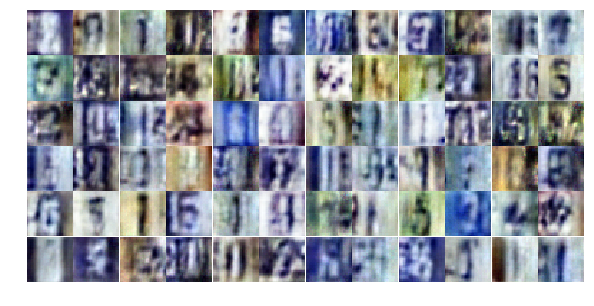

Epoch 7/25... Discriminator Loss: 0.8798... Generator Loss: 4.7447
Epoch 7/25... Discriminator Loss: 0.3455... Generator Loss: 1.7969
Epoch 7/25... Discriminator Loss: 0.6092... Generator Loss: 1.1988
Epoch 7/25... Discriminator Loss: 0.2352... Generator Loss: 2.3643
Epoch 7/25... Discriminator Loss: 0.1474... Generator Loss: 3.0911
Epoch 7/25... Discriminator Loss: 0.2792... Generator Loss: 2.9715
Epoch 7/25... Discriminator Loss: 0.3195... Generator Loss: 4.3619
Epoch 7/25... Discriminator Loss: 0.3642... Generator Loss: 2.1372
Epoch 7/25... Discriminator Loss: 0.2241... Generator Loss: 3.5846
Epoch 7/25... Discriminator Loss: 0.1110... Generator Loss: 3.5189


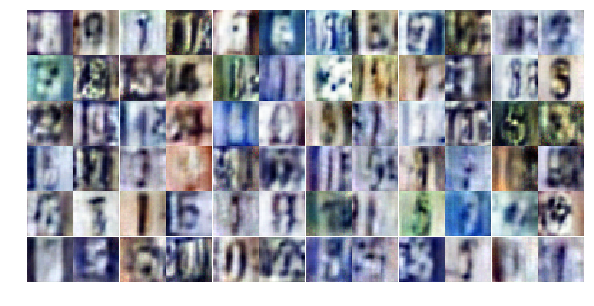

Epoch 7/25... Discriminator Loss: 0.0979... Generator Loss: 4.4185
Epoch 7/25... Discriminator Loss: 0.0954... Generator Loss: 4.0384
Epoch 7/25... Discriminator Loss: 0.2900... Generator Loss: 2.8481
Epoch 7/25... Discriminator Loss: 0.2387... Generator Loss: 2.3967
Epoch 7/25... Discriminator Loss: 0.2296... Generator Loss: 6.6519
Epoch 7/25... Discriminator Loss: 0.1320... Generator Loss: 3.4992
Epoch 7/25... Discriminator Loss: 0.1986... Generator Loss: 2.8032
Epoch 7/25... Discriminator Loss: 0.6428... Generator Loss: 1.2582
Epoch 7/25... Discriminator Loss: 2.0707... Generator Loss: 0.2026
Epoch 7/25... Discriminator Loss: 0.3255... Generator Loss: 3.9264


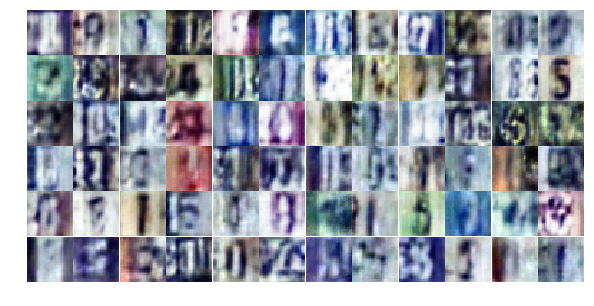

Epoch 7/25... Discriminator Loss: 0.4091... Generator Loss: 1.8144
Epoch 7/25... Discriminator Loss: 0.1316... Generator Loss: 3.5638
Epoch 7/25... Discriminator Loss: 0.1094... Generator Loss: 4.3338
Epoch 7/25... Discriminator Loss: 0.1305... Generator Loss: 3.0910
Epoch 7/25... Discriminator Loss: 0.1773... Generator Loss: 2.7458
Epoch 7/25... Discriminator Loss: 0.1961... Generator Loss: 2.4378
Epoch 7/25... Discriminator Loss: 1.2213... Generator Loss: 1.6317
Epoch 7/25... Discriminator Loss: 1.1949... Generator Loss: 0.5552
Epoch 7/25... Discriminator Loss: 2.0537... Generator Loss: 0.2426
Epoch 7/25... Discriminator Loss: 0.4017... Generator Loss: 1.6491


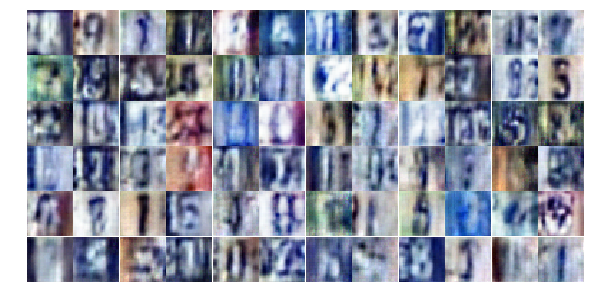

Epoch 7/25... Discriminator Loss: 0.8110... Generator Loss: 2.4841
Epoch 7/25... Discriminator Loss: 0.5403... Generator Loss: 1.2075
Epoch 7/25... Discriminator Loss: 0.6349... Generator Loss: 0.9876
Epoch 7/25... Discriminator Loss: 0.3455... Generator Loss: 2.4096
Epoch 7/25... Discriminator Loss: 0.3834... Generator Loss: 1.6974
Epoch 7/25... Discriminator Loss: 0.2947... Generator Loss: 1.8643
Epoch 7/25... Discriminator Loss: 0.3881... Generator Loss: 1.4518
Epoch 7/25... Discriminator Loss: 0.5968... Generator Loss: 1.1205
Epoch 7/25... Discriminator Loss: 0.1612... Generator Loss: 3.1060
Epoch 7/25... Discriminator Loss: 2.6793... Generator Loss: 0.2385


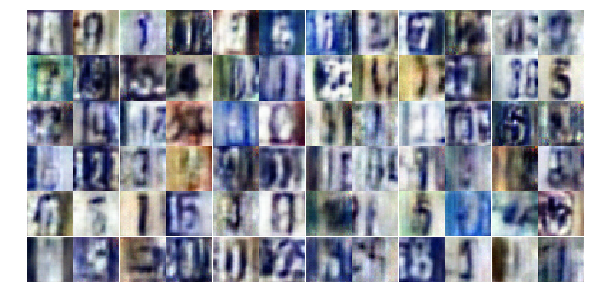

Epoch 7/25... Discriminator Loss: 0.5225... Generator Loss: 3.7594
Epoch 7/25... Discriminator Loss: 0.4189... Generator Loss: 1.5298
Epoch 7/25... Discriminator Loss: 0.7384... Generator Loss: 0.8601
Epoch 7/25... Discriminator Loss: 0.4378... Generator Loss: 1.4355
Epoch 7/25... Discriminator Loss: 0.6244... Generator Loss: 1.0597
Epoch 7/25... Discriminator Loss: 0.1525... Generator Loss: 3.0432
Epoch 7/25... Discriminator Loss: 1.3706... Generator Loss: 0.3811
Epoch 7/25... Discriminator Loss: 0.5097... Generator Loss: 1.2893
Epoch 7/25... Discriminator Loss: 0.3119... Generator Loss: 1.8839
Epoch 7/25... Discriminator Loss: 0.3820... Generator Loss: 2.3441


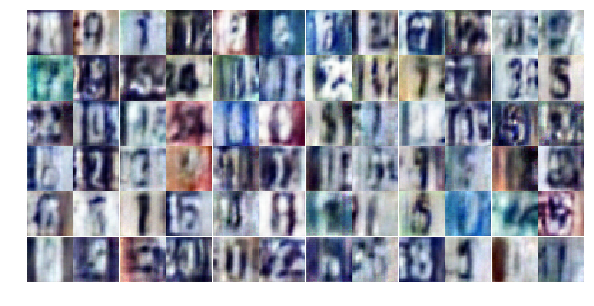

Epoch 7/25... Discriminator Loss: 0.1494... Generator Loss: 2.9101
Epoch 8/25... Discriminator Loss: 0.2244... Generator Loss: 2.1975
Epoch 8/25... Discriminator Loss: 0.7951... Generator Loss: 0.8139
Epoch 8/25... Discriminator Loss: 0.3936... Generator Loss: 1.6594
Epoch 8/25... Discriminator Loss: 1.3434... Generator Loss: 0.4693
Epoch 8/25... Discriminator Loss: 0.3685... Generator Loss: 1.7333
Epoch 8/25... Discriminator Loss: 1.1975... Generator Loss: 0.6868
Epoch 8/25... Discriminator Loss: 1.0450... Generator Loss: 4.1000
Epoch 8/25... Discriminator Loss: 0.5457... Generator Loss: 1.4821
Epoch 8/25... Discriminator Loss: 0.7988... Generator Loss: 0.7794


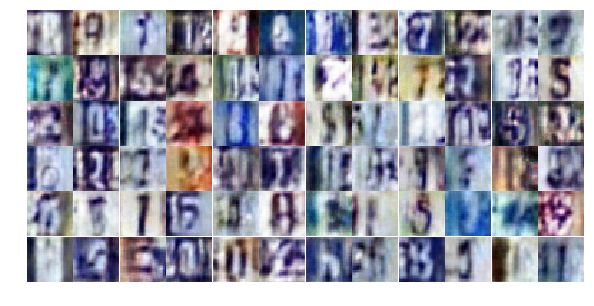

Epoch 8/25... Discriminator Loss: 0.2002... Generator Loss: 4.1384
Epoch 8/25... Discriminator Loss: 0.4104... Generator Loss: 1.5337
Epoch 8/25... Discriminator Loss: 0.5196... Generator Loss: 1.1907
Epoch 8/25... Discriminator Loss: 0.1909... Generator Loss: 2.9861
Epoch 8/25... Discriminator Loss: 0.3147... Generator Loss: 2.0600
Epoch 8/25... Discriminator Loss: 0.8159... Generator Loss: 4.3991
Epoch 8/25... Discriminator Loss: 2.3741... Generator Loss: 0.2509
Epoch 8/25... Discriminator Loss: 0.7009... Generator Loss: 1.1192
Epoch 8/25... Discriminator Loss: 0.8437... Generator Loss: 1.3123
Epoch 8/25... Discriminator Loss: 0.6282... Generator Loss: 1.1818


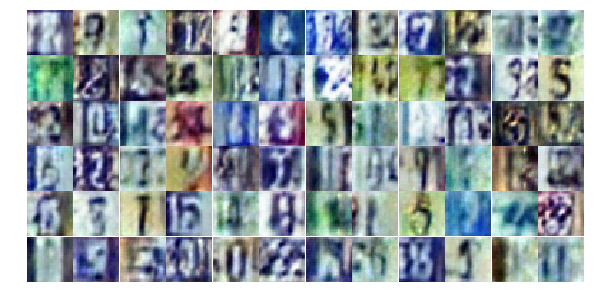

Epoch 8/25... Discriminator Loss: 0.1762... Generator Loss: 3.3110
Epoch 8/25... Discriminator Loss: 0.4283... Generator Loss: 1.7040
Epoch 8/25... Discriminator Loss: 0.7261... Generator Loss: 0.9046
Epoch 8/25... Discriminator Loss: 0.4773... Generator Loss: 2.7874
Epoch 8/25... Discriminator Loss: 0.3109... Generator Loss: 1.9274
Epoch 8/25... Discriminator Loss: 0.8560... Generator Loss: 0.7530
Epoch 8/25... Discriminator Loss: 0.4174... Generator Loss: 1.4354
Epoch 8/25... Discriminator Loss: 0.4450... Generator Loss: 1.3837
Epoch 8/25... Discriminator Loss: 0.3113... Generator Loss: 3.2618
Epoch 8/25... Discriminator Loss: 1.3658... Generator Loss: 4.4281


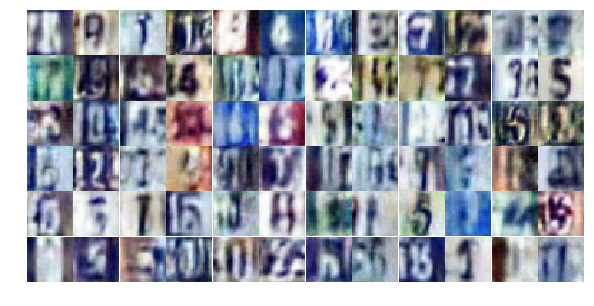

Epoch 8/25... Discriminator Loss: 0.4382... Generator Loss: 2.3480
Epoch 8/25... Discriminator Loss: 0.9709... Generator Loss: 0.6581
Epoch 8/25... Discriminator Loss: 0.4445... Generator Loss: 1.4435
Epoch 8/25... Discriminator Loss: 0.4655... Generator Loss: 1.3492
Epoch 8/25... Discriminator Loss: 0.3468... Generator Loss: 1.7882
Epoch 8/25... Discriminator Loss: 0.2262... Generator Loss: 2.1048
Epoch 8/25... Discriminator Loss: 0.4267... Generator Loss: 1.4930
Epoch 8/25... Discriminator Loss: 0.3008... Generator Loss: 1.9174
Epoch 8/25... Discriminator Loss: 0.8142... Generator Loss: 0.7967
Epoch 8/25... Discriminator Loss: 0.4157... Generator Loss: 1.5414


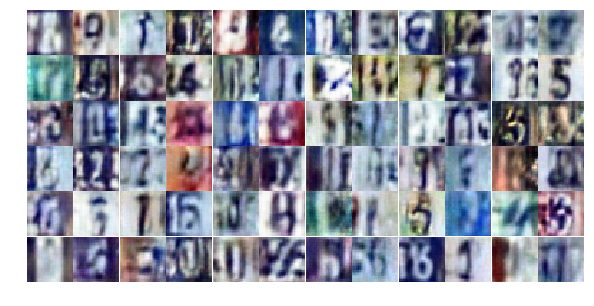

Epoch 8/25... Discriminator Loss: 0.2788... Generator Loss: 1.9445
Epoch 8/25... Discriminator Loss: 0.8232... Generator Loss: 0.7506
Epoch 8/25... Discriminator Loss: 0.3410... Generator Loss: 2.0113
Epoch 8/25... Discriminator Loss: 0.1379... Generator Loss: 2.8392
Epoch 8/25... Discriminator Loss: 2.3178... Generator Loss: 5.6929
Epoch 8/25... Discriminator Loss: 1.2877... Generator Loss: 0.4715
Epoch 8/25... Discriminator Loss: 0.8028... Generator Loss: 0.8212
Epoch 8/25... Discriminator Loss: 0.4584... Generator Loss: 1.7466
Epoch 8/25... Discriminator Loss: 0.7269... Generator Loss: 0.8403
Epoch 8/25... Discriminator Loss: 0.3514... Generator Loss: 1.6791


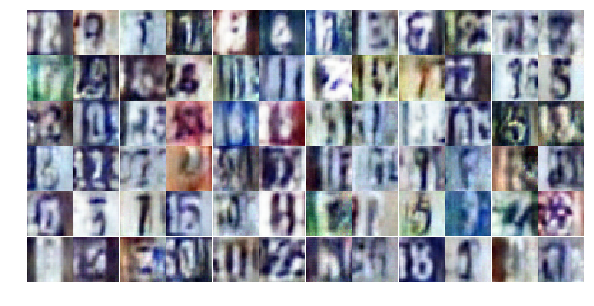

Epoch 8/25... Discriminator Loss: 0.3342... Generator Loss: 2.1581
Epoch 8/25... Discriminator Loss: 0.3487... Generator Loss: 1.6454
Epoch 8/25... Discriminator Loss: 0.2697... Generator Loss: 2.2169
Epoch 8/25... Discriminator Loss: 2.3409... Generator Loss: 0.3107
Epoch 8/25... Discriminator Loss: 0.8193... Generator Loss: 1.6447
Epoch 8/25... Discriminator Loss: 0.7050... Generator Loss: 1.8801
Epoch 8/25... Discriminator Loss: 0.4132... Generator Loss: 2.8118
Epoch 8/25... Discriminator Loss: 0.4549... Generator Loss: 2.2866
Epoch 9/25... Discriminator Loss: 0.6542... Generator Loss: 1.1950
Epoch 9/25... Discriminator Loss: 0.6476... Generator Loss: 1.0342


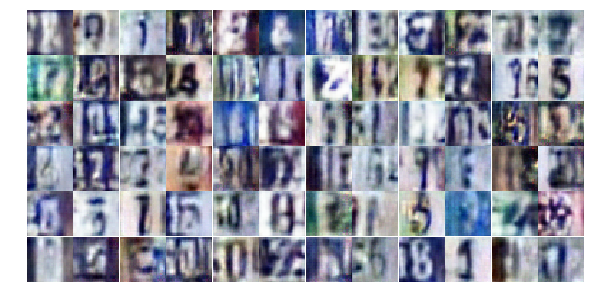

Epoch 9/25... Discriminator Loss: 0.3855... Generator Loss: 1.5967
Epoch 9/25... Discriminator Loss: 0.3138... Generator Loss: 3.4543
Epoch 9/25... Discriminator Loss: 0.4418... Generator Loss: 1.4982
Epoch 9/25... Discriminator Loss: 0.1596... Generator Loss: 2.6546
Epoch 9/25... Discriminator Loss: 0.6644... Generator Loss: 1.0804
Epoch 9/25... Discriminator Loss: 0.4354... Generator Loss: 1.5307
Epoch 9/25... Discriminator Loss: 0.4210... Generator Loss: 1.5515
Epoch 9/25... Discriminator Loss: 0.3813... Generator Loss: 1.5940
Epoch 9/25... Discriminator Loss: 0.3771... Generator Loss: 1.7746
Epoch 9/25... Discriminator Loss: 0.3970... Generator Loss: 1.8266


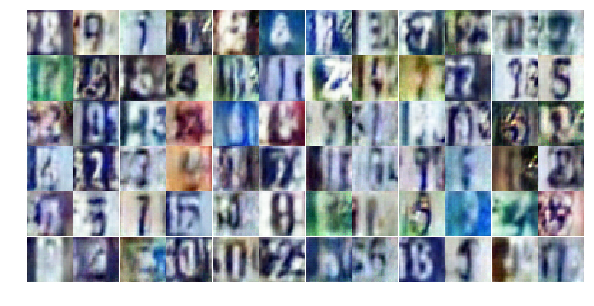

Epoch 9/25... Discriminator Loss: 0.2120... Generator Loss: 5.0132
Epoch 9/25... Discriminator Loss: 0.6370... Generator Loss: 2.2086
Epoch 9/25... Discriminator Loss: 0.7229... Generator Loss: 4.5911
Epoch 9/25... Discriminator Loss: 2.1873... Generator Loss: 4.2701
Epoch 9/25... Discriminator Loss: 1.3006... Generator Loss: 0.4470
Epoch 9/25... Discriminator Loss: 0.9612... Generator Loss: 0.6478
Epoch 9/25... Discriminator Loss: 0.5457... Generator Loss: 1.2859
Epoch 9/25... Discriminator Loss: 0.5000... Generator Loss: 1.3814
Epoch 9/25... Discriminator Loss: 0.9549... Generator Loss: 0.6781
Epoch 9/25... Discriminator Loss: 0.4202... Generator Loss: 1.6187


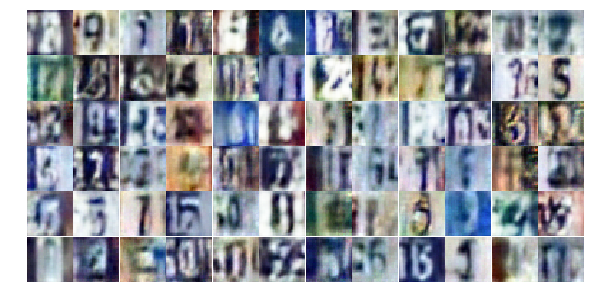

Epoch 9/25... Discriminator Loss: 0.3811... Generator Loss: 2.1608
Epoch 9/25... Discriminator Loss: 0.4528... Generator Loss: 1.5446
Epoch 9/25... Discriminator Loss: 0.4282... Generator Loss: 1.5114
Epoch 9/25... Discriminator Loss: 0.3540... Generator Loss: 2.0592
Epoch 9/25... Discriminator Loss: 0.5573... Generator Loss: 3.4733
Epoch 9/25... Discriminator Loss: 0.4381... Generator Loss: 4.2340
Epoch 9/25... Discriminator Loss: 0.6906... Generator Loss: 1.4240
Epoch 9/25... Discriminator Loss: 0.3990... Generator Loss: 1.5162
Epoch 9/25... Discriminator Loss: 0.4548... Generator Loss: 1.7560
Epoch 9/25... Discriminator Loss: 0.2056... Generator Loss: 2.1856


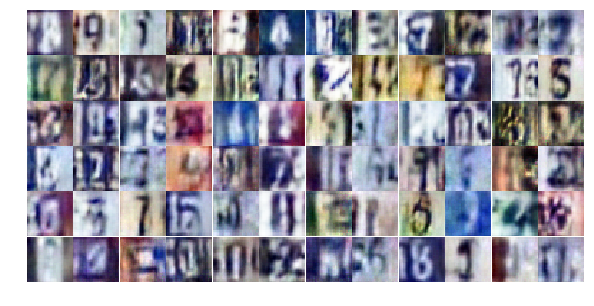

Epoch 9/25... Discriminator Loss: 0.3895... Generator Loss: 1.7478
Epoch 9/25... Discriminator Loss: 0.8901... Generator Loss: 0.7055
Epoch 9/25... Discriminator Loss: 0.9202... Generator Loss: 0.7105
Epoch 9/25... Discriminator Loss: 1.5433... Generator Loss: 0.3676
Epoch 9/25... Discriminator Loss: 0.3842... Generator Loss: 2.5760
Epoch 9/25... Discriminator Loss: 0.7761... Generator Loss: 0.8484
Epoch 9/25... Discriminator Loss: 0.2950... Generator Loss: 2.0558
Epoch 9/25... Discriminator Loss: 0.4280... Generator Loss: 1.3889
Epoch 9/25... Discriminator Loss: 0.6605... Generator Loss: 1.0205
Epoch 9/25... Discriminator Loss: 0.6840... Generator Loss: 0.9773


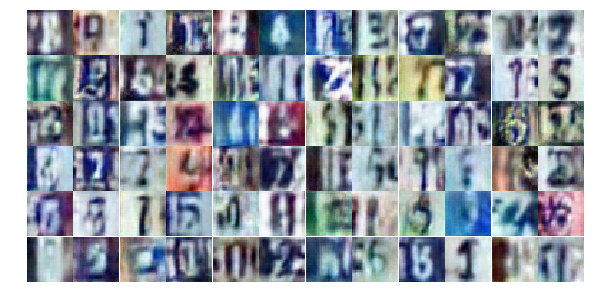

Epoch 9/25... Discriminator Loss: 0.3756... Generator Loss: 2.1166
Epoch 9/25... Discriminator Loss: 0.3739... Generator Loss: 1.9938
Epoch 9/25... Discriminator Loss: 0.3606... Generator Loss: 1.6940
Epoch 9/25... Discriminator Loss: 0.3901... Generator Loss: 1.6136
Epoch 9/25... Discriminator Loss: 0.4247... Generator Loss: 1.6972
Epoch 9/25... Discriminator Loss: 0.5172... Generator Loss: 1.2270
Epoch 9/25... Discriminator Loss: 1.1914... Generator Loss: 0.5216
Epoch 9/25... Discriminator Loss: 0.7524... Generator Loss: 0.8664
Epoch 9/25... Discriminator Loss: 0.3028... Generator Loss: 2.3334
Epoch 9/25... Discriminator Loss: 0.3325... Generator Loss: 2.5455


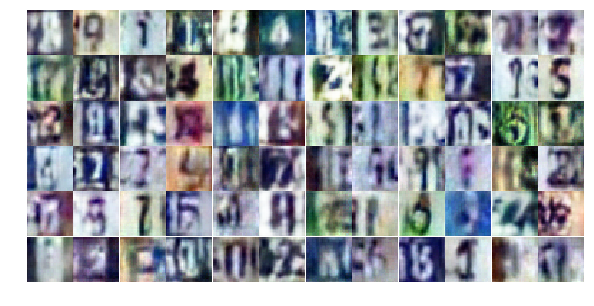

Epoch 9/25... Discriminator Loss: 0.6157... Generator Loss: 1.2016
Epoch 9/25... Discriminator Loss: 2.3026... Generator Loss: 4.6805
Epoch 9/25... Discriminator Loss: 0.6936... Generator Loss: 1.0711
Epoch 9/25... Discriminator Loss: 0.5713... Generator Loss: 2.0384
Epoch 9/25... Discriminator Loss: 0.3155... Generator Loss: 2.1790
Epoch 10/25... Discriminator Loss: 0.3724... Generator Loss: 1.8373
Epoch 10/25... Discriminator Loss: 0.5029... Generator Loss: 1.2851
Epoch 10/25... Discriminator Loss: 0.4313... Generator Loss: 1.5120
Epoch 10/25... Discriminator Loss: 0.6260... Generator Loss: 1.8269
Epoch 10/25... Discriminator Loss: 0.4229... Generator Loss: 4.2392


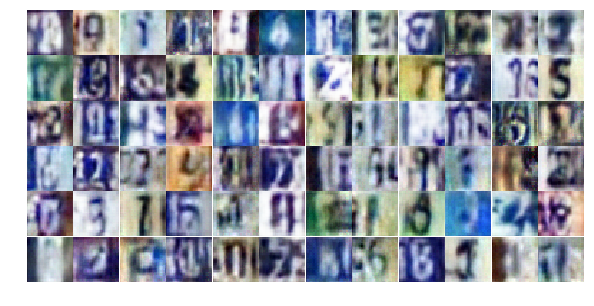

Epoch 10/25... Discriminator Loss: 0.5394... Generator Loss: 1.2361
Epoch 10/25... Discriminator Loss: 0.6429... Generator Loss: 1.0235
Epoch 10/25... Discriminator Loss: 0.3938... Generator Loss: 1.7196
Epoch 10/25... Discriminator Loss: 0.4201... Generator Loss: 1.4915
Epoch 10/25... Discriminator Loss: 0.5072... Generator Loss: 1.4533
Epoch 10/25... Discriminator Loss: 0.7366... Generator Loss: 0.9194
Epoch 10/25... Discriminator Loss: 0.4462... Generator Loss: 1.3285
Epoch 10/25... Discriminator Loss: 0.4125... Generator Loss: 1.4146
Epoch 10/25... Discriminator Loss: 1.3881... Generator Loss: 0.3967
Epoch 10/25... Discriminator Loss: 0.4950... Generator Loss: 1.6588


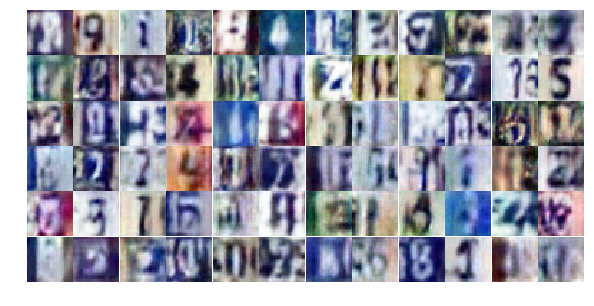

Epoch 10/25... Discriminator Loss: 1.9422... Generator Loss: 0.2921
Epoch 10/25... Discriminator Loss: 0.9812... Generator Loss: 1.5754
Epoch 10/25... Discriminator Loss: 0.4345... Generator Loss: 1.8099
Epoch 10/25... Discriminator Loss: 0.5890... Generator Loss: 1.2852
Epoch 10/25... Discriminator Loss: 0.3436... Generator Loss: 2.3249
Epoch 10/25... Discriminator Loss: 0.5798... Generator Loss: 1.1850
Epoch 10/25... Discriminator Loss: 0.3649... Generator Loss: 1.8916
Epoch 10/25... Discriminator Loss: 0.6624... Generator Loss: 0.9481
Epoch 10/25... Discriminator Loss: 0.5607... Generator Loss: 1.2049
Epoch 10/25... Discriminator Loss: 0.3927... Generator Loss: 2.5265


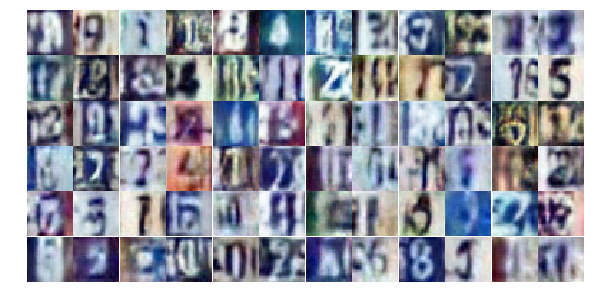

Epoch 10/25... Discriminator Loss: 1.0512... Generator Loss: 0.6064
Epoch 10/25... Discriminator Loss: 0.6113... Generator Loss: 1.1458
Epoch 10/25... Discriminator Loss: 0.3680... Generator Loss: 1.7250
Epoch 10/25... Discriminator Loss: 0.3585... Generator Loss: 3.6436
Epoch 10/25... Discriminator Loss: 1.4656... Generator Loss: 0.3584
Epoch 10/25... Discriminator Loss: 0.3611... Generator Loss: 2.3957
Epoch 10/25... Discriminator Loss: 0.3397... Generator Loss: 2.0946
Epoch 10/25... Discriminator Loss: 0.9332... Generator Loss: 3.2871
Epoch 10/25... Discriminator Loss: 0.4484... Generator Loss: 1.3411
Epoch 10/25... Discriminator Loss: 0.5137... Generator Loss: 1.7556


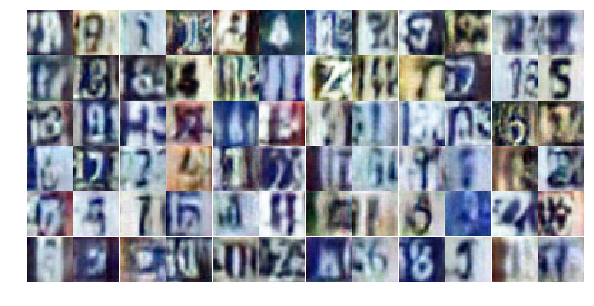

Epoch 10/25... Discriminator Loss: 0.3832... Generator Loss: 2.0684
Epoch 10/25... Discriminator Loss: 1.1404... Generator Loss: 0.4984
Epoch 10/25... Discriminator Loss: 0.5371... Generator Loss: 1.3430
Epoch 10/25... Discriminator Loss: 0.5774... Generator Loss: 1.1501
Epoch 10/25... Discriminator Loss: 0.4251... Generator Loss: 1.7033
Epoch 10/25... Discriminator Loss: 1.1074... Generator Loss: 0.5791
Epoch 10/25... Discriminator Loss: 1.5448... Generator Loss: 3.2065
Epoch 10/25... Discriminator Loss: 1.6549... Generator Loss: 0.3107
Epoch 10/25... Discriminator Loss: 0.5431... Generator Loss: 1.8463
Epoch 10/25... Discriminator Loss: 0.3480... Generator Loss: 2.0741


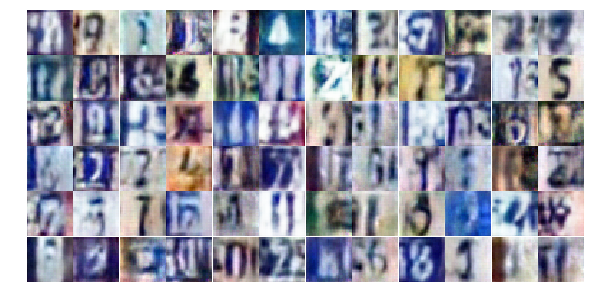

Epoch 10/25... Discriminator Loss: 1.8088... Generator Loss: 0.2692
Epoch 10/25... Discriminator Loss: 0.5093... Generator Loss: 1.3071
Epoch 10/25... Discriminator Loss: 0.5038... Generator Loss: 1.4302
Epoch 10/25... Discriminator Loss: 0.4343... Generator Loss: 1.7656
Epoch 10/25... Discriminator Loss: 0.4015... Generator Loss: 1.8289
Epoch 10/25... Discriminator Loss: 0.7797... Generator Loss: 0.7746
Epoch 10/25... Discriminator Loss: 0.3542... Generator Loss: 1.6968
Epoch 10/25... Discriminator Loss: 0.4063... Generator Loss: 1.5947
Epoch 10/25... Discriminator Loss: 0.3930... Generator Loss: 1.9541
Epoch 10/25... Discriminator Loss: 0.7592... Generator Loss: 0.8626


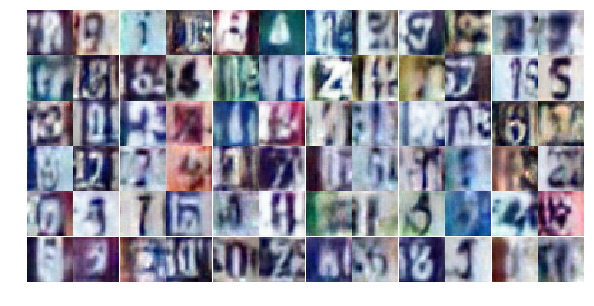

Epoch 10/25... Discriminator Loss: 0.6578... Generator Loss: 2.8201
Epoch 10/25... Discriminator Loss: 0.3729... Generator Loss: 1.6565
Epoch 10/25... Discriminator Loss: 0.7360... Generator Loss: 0.8066
Epoch 11/25... Discriminator Loss: 0.6157... Generator Loss: 1.2416
Epoch 11/25... Discriminator Loss: 0.4676... Generator Loss: 1.2644
Epoch 11/25... Discriminator Loss: 1.3224... Generator Loss: 0.4013
Epoch 11/25... Discriminator Loss: 0.3080... Generator Loss: 1.9399
Epoch 11/25... Discriminator Loss: 0.4149... Generator Loss: 2.4781
Epoch 11/25... Discriminator Loss: 1.4581... Generator Loss: 1.6891
Epoch 11/25... Discriminator Loss: 0.5283... Generator Loss: 1.6482


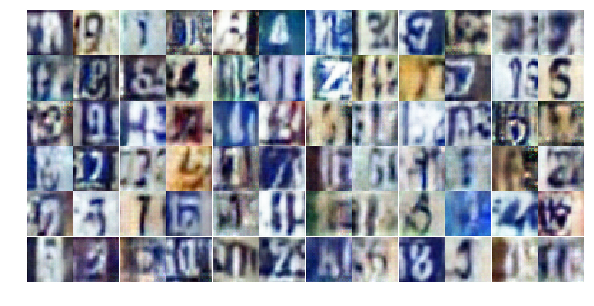

Epoch 11/25... Discriminator Loss: 0.3263... Generator Loss: 2.4633
Epoch 11/25... Discriminator Loss: 0.5086... Generator Loss: 1.4804
Epoch 11/25... Discriminator Loss: 0.2600... Generator Loss: 2.3016
Epoch 11/25... Discriminator Loss: 0.6877... Generator Loss: 0.9564
Epoch 11/25... Discriminator Loss: 0.6599... Generator Loss: 1.0266
Epoch 11/25... Discriminator Loss: 0.2555... Generator Loss: 2.3780
Epoch 11/25... Discriminator Loss: 0.4125... Generator Loss: 1.4568
Epoch 11/25... Discriminator Loss: 0.1218... Generator Loss: 4.8464
Epoch 11/25... Discriminator Loss: 0.9239... Generator Loss: 1.4434
Epoch 11/25... Discriminator Loss: 2.0318... Generator Loss: 0.1915


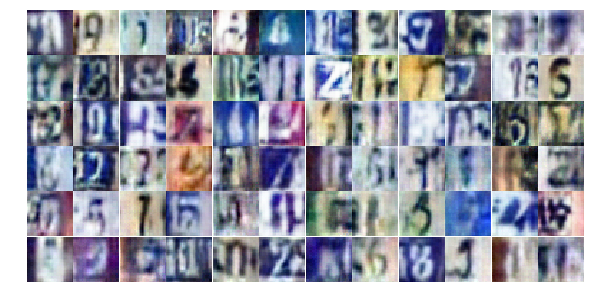

Epoch 11/25... Discriminator Loss: 1.0324... Generator Loss: 0.6474
Epoch 11/25... Discriminator Loss: 0.4973... Generator Loss: 1.6645


In [ ]:
dataset = Dataset(trainset, testset)

losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

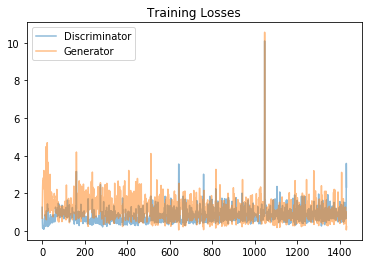

In [18]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

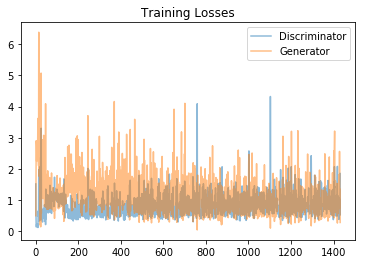

In [18]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

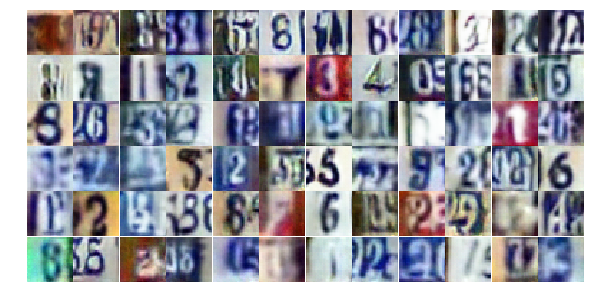

In [19]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

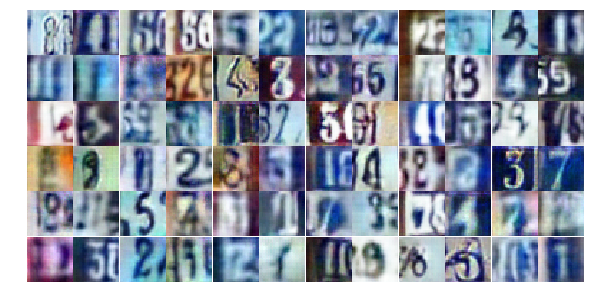

In [19]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))